<a href="https://colab.research.google.com/github/penguinshunya/ml/blob/main/mario-cart-8dx.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount("/content/drive")

import cv2
import json
import matplotlib.pyplot as plt
import numpy as np
import pathlib
import random
import scipy as sp
import seaborn as sns
import tensorflow as tf
from google.colab.patches import cv2_imshow
from tensorflow import keras
from tensorflow.keras import callbacks, layers, losses, models, optimizers

Mounted at /content/drive


In [2]:
!unzip -q drive/MyDrive/mario-cart-8dx/rank-screen.zip

In [ ]:
!unzip -q drive/MyDrive/mario-cart-8dx/rank-screen-model.zip

In [ ]:
rank_screen_model = tf.keras.models.load_model("rank-screen-model")
rank_screen_model.summary()
rank_screen_model.trainable = False

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 480, 480, 3  0           []                               
                                )]                                                                
                                                                                                  
 tf.math.truediv (TFOpLambda)   (None, 480, 480, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv2d (Conv2D)                (None, 480, 480, 32  896         ['tf.math.truediv[0][0]']        
                                )                                                                 
                                                                                              

In [ ]:
inputs = layers.Input((480, 480, 3))
x_ = inputs / 255
x1 = layers.Conv2D(32, 3, activation="selu", padding="same")(x_)
x = layers.MaxPool2D(2)(x1)
x2 = layers.Conv2D(32, 3, activation="selu", padding="same")(x)
x = layers.MaxPool2D(2)(x2)
x3 = layers.Conv2D(32, 3, activation="selu", padding="same")(x)
x = layers.MaxPool2D(2)(x3)
x4 = layers.Conv2D(32, 3, activation="selu", padding="same")(x)
x = layers.MaxPool2D(2)(x4)
x5 = layers.Conv2D(32, 3, activation="selu", padding="same")(x)
x = layers.MaxPool2D(2)(x5)
x = layers.Conv2D(32, 3, activation="selu", padding="same")(x)
x = layers.UpSampling2D(2)(x)
x = layers.concatenate([x, x5])
x = layers.Conv2D(32, 1, activation="selu", padding="same")(x)
x = layers.UpSampling2D(2)(x)
x = layers.concatenate([x, x4])
x = layers.Conv2D(32, 1, activation="selu", padding="same")(x)
x = layers.UpSampling2D(2)(x)
x = layers.concatenate([x, x3])
x = layers.Conv2D(32, 1, activation="selu", padding="same")(x)
x = layers.UpSampling2D(2)(x)
x = layers.concatenate([x, x2])
x = layers.Conv2D(32, 1, activation="selu", padding="same")(x)
x = layers.UpSampling2D(2)(x)
x = layers.concatenate([x, x_])
x = layers.Conv2D(1, 1, activation="sigmoid")(x)
outputs = layers.Reshape((480, 480))(x)

rank_screen_model = keras.Model(inputs, outputs)
rank_screen_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 480, 480, 3  0           []                               
                                )]                                                                
                                                                                                  
 tf.math.truediv (TFOpLambda)   (None, 480, 480, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv2d (Conv2D)                (None, 480, 480, 32  896         ['tf.math.truediv[0][0]']        
                                )                                                                 
                                                                                              

In [3]:
def base_generator(skip=0):
  with open('./rank-screen/index.json', 'r') as f:
    j = json.load(f)
  random.seed(0)
  random.shuffle(j)
  for i, row in enumerate(j):
    if i < skip:
      continue
    path = pathlib.Path("rank-screen")/row["path"]
    path = str(path)
    image = cv2.imread(path)
    image = cv2.resize(image, (480, 480))
    row["left"] = row["left"] * 480 / 640
    row["right"] = row["right"] * 480 / 640
    yield image, row

def base_generator_src(skip=0):
  with open('./rank-screen/index.json', 'r') as f:
    j = json.load(f)
  random.seed(0)
  random.shuffle(j)
  for i, row in enumerate(j):
    if i < skip:
      continue
    path = pathlib.Path("rank-screen")/row["path"]
    path = str(path)
    image = cv2.imread(path)
    row["left"] = row["left"]
    row["right"] = row["right"]
    yield image, row

In [49]:
ROW_H = 24
ROW_W = int(ROW_H * 27 / 2)
TARGET_W = int(ROW_W / 6)

def make_current_point_array(row):
  c = row["current_point"]
  arr = [10, 10, 10, 10, 10]
  if c == 0:
    arr[0] = 0
    return arr
  i = 0
  while c > 0:
    n = c % 10
    arr[i] = n
    c = c // 10
    i += 1
  return arr

def ro_generator(skip=0):
  it = base_generator_src()
  count = 0
  for image, row in it:
    p = row["participants"]
    h = row["bottom"] - row["top"]
    row_w = int(row["right"] - row["left"])
    row_h = (76. * h) / (83. * p - 7)
    pad_h = row_h * 7 / 76
    curr_x = int(row["left"])
    curr_y = row["top"]
    for i in range(p):
      count += 1
      if count <= skip:
        curr_y += row_h + pad_h
        continue
      if row["rows"][i]["kind"] == "Unavailable":
        curr_y += row_h + pad_h
        continue
      img = image[int(curr_y):int(curr_y+row_h), curr_x+int(row_w*5/6):curr_x+row_w]
      img = cv2.resize(img, (TARGET_W, ROW_H))
      yield img, make_current_point_array(row["rows"][i])
      curr_y += row_h + pad_h

def ro_generator_test(skip=0):
  it = base_generator_src()
  count = 0
  for image, row in it:
    p = row["participants"]
    h = row["bottom"] - row["top"]
    row_w = int(row["right"] - row["left"])
    row_h = (76. * h) / (83. * p - 7)
    pad_h = row_h * 7 / 76
    curr_x = int(row["left"])
    curr_y = row["top"]
    for i in range(p):
      count += 1
      if count <= skip:
        curr_y += row_h + pad_h
        continue
      if row["rows"][i]["kind"] == "Unavailable":
        curr_y += row_h + pad_h
        continue
      img = image[int(curr_y):int(curr_y+row_h), curr_x+int(row_w*5/6):curr_x+row_w]
      img = cv2.resize(img, (TARGET_W, ROW_H))
      yield img, make_current_point_array(row["rows"][i]), row["path"], i
      curr_y += row_h + pad_h

ro_output_signature = (
  tf.TensorSpec(shape=(ROW_H, TARGET_W, 3), dtype=tf.float32),
  tf.TensorSpec(shape=(5,), dtype=tf.int32),
)

ro_train_ds = tf.data.Dataset.from_generator(ro_generator, output_signature=ro_output_signature)
ro_train_ds = ro_train_ds.batch(64).take(32).cache()
ro_valid_ds = tf.data.Dataset.from_generator(ro_generator, args=[64 * 32], output_signature=ro_output_signature)
ro_valid_ds = ro_valid_ds.batch(64).take(8).cache()
ro_tests_ds = tf.data.Dataset.from_generator(ro_generator_test, args=[64 * 32], output_signature=(
  tf.TensorSpec(shape=(ROW_H, TARGET_W, 3), dtype=tf.float32),
  tf.TensorSpec(shape=(5,), dtype=tf.int32),
  tf.TensorSpec((), dtype=tf.string),
  tf.TensorSpec((), dtype=tf.int32),
))
ro_tests_ds = ro_tests_ds.batch(64).take(8).cache()

print(f"TARGET_W: {TARGET_W}, TARGET_H: {ROW_H}")

count = 0
for image, info in ro_generator():
  if count == 0:
    print(image.shape)
  cv2_imshow(image)
  print(info)
  count += 1
  if count == 16:
    break

TARGET_W: 54, TARGET_H: 24
(24, 54, 3)


[0, 3, 10, 10, 10]


[4, 1, 10, 10, 10]


[9, 1, 10, 10, 10]


[7, 1, 10, 10, 10]


[5, 1, 10, 10, 10]


[8, 10, 10, 10, 10]


[2, 1, 10, 10, 10]


[8, 10, 10, 10, 10]


[8, 10, 10, 10, 10]


[8, 10, 10, 10, 10]


[2, 1, 10, 10, 10]


[3, 1, 10, 10, 10]


[1, 9, 5, 8, 10]


[9, 8, 6, 8, 10]


[1, 6, 2, 6, 10]


[9, 9, 5, 3, 1]


In [50]:
inputs = layers.Input((24, 54, 3))
x = layers.Conv2D(32, (3, 4), activation="selu")(inputs)
x = layers.Conv2D(32, (3, 4), activation="selu")(x)
x = layers.Conv2D(32, (3, 4), activation="selu")(x)
x = layers.Conv2D(32, (3, 4), activation="selu")(x)
x = layers.Conv2D(64, (3, 4), activation="selu")(x)
x = layers.Conv2D(64, (3, 4), activation="selu")(x)
x = layers.Conv2D(64, (3, 4), activation="selu")(x)
x = layers.Conv2D(64, (3, 4), activation="selu")(x)
x = layers.Flatten()(x)
x = layers.Reshape((5, 3072))(x)
outputs = layers.Dense(11, activation="softmax")(x)
ro_model = keras.Model(inputs, outputs)
ro_model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 24, 54, 3)]       0         
                                                                 
 conv2d_16 (Conv2D)          (None, 22, 51, 32)        1184      
                                                                 
 conv2d_17 (Conv2D)          (None, 20, 48, 32)        12320     
                                                                 
 conv2d_18 (Conv2D)          (None, 18, 45, 32)        12320     
                                                                 
 conv2d_19 (Conv2D)          (None, 16, 42, 32)        12320     
                                                                 
 conv2d_20 (Conv2D)          (None, 14, 39, 64)        24640     
                                                                 
 conv2d_21 (Conv2D)          (None, 12, 36, 64)        4921

In [51]:
ro_model.compile(optimizer="adam", loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
ro_history = ro_model.fit(
  ro_train_ds,
  validation_data=ro_valid_ds, 
  callbacks=[tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=16, restore_best_weights=True)], 
  epochs=1000
)

Epoch 1/1000
32/32 [==============================] - 9s 189ms/step - loss: 3.4313 - accuracy: 0.2708 - val_loss: 2.1437 - val_accuracy: 0.3715
Epoch 2/1000
32/32 [==============================] - 1s 22ms/step - loss: 1.9936 - accuracy: 0.3910 - val_loss: 1.9735 - val_accuracy: 0.3941
Epoch 3/1000
32/32 [==============================] - 1s 19ms/step - loss: 1.7082 - accuracy: 0.4455 - val_loss: 1.6003 - val_accuracy: 0.4812
Epoch 4/1000
32/32 [==============================] - 1s 19ms/step - loss: 1.4966 - accuracy: 0.5062 - val_loss: 1.3988 - val_accuracy: 0.5367
Epoch 5/1000
32/32 [==============================] - 1s 19ms/step - loss: 1.2634 - accuracy: 0.5775 - val_loss: 1.2111 - val_accuracy: 0.6043
Epoch 6/1000
32/32 [==============================] - 1s 19ms/step - loss: 1.0425 - accuracy: 0.6480 - val_loss: 1.0656 - val_accuracy: 0.6523
Epoch 7/1000
32/32 [==============================] - 1s 19ms/step - loss: 0.9205 - accuracy: 0.6864 - val_loss: 0.9965 - val_accuracy: 0.675

In [52]:
def format(arr):
  x = arr[0]
  x += 0 if arr[1] == 10 else arr[1] * 10
  x += 0 if arr[2] == 10 else arr[2] * 100
  x += 0 if arr[3] == 10 else arr[3] * 1000
  x += 0 if arr[4] == 10 else arr[4] * 10000
  return x

for (x, y_true, path, index) in ro_tests_ds:
  y_pred = ro_model.predict(x)
  for i, (x, y) in enumerate(zip(x, y_pred)):
    pred = tf.argmax(y, axis=-1)
    a = format(y_true[i].numpy())
    b = format(pred.numpy())
    if a != b:
      cv2_imshow(x.numpy())
      print(f"expect {a} not be {b}, path: {path[i]} (index: {index[i]})")

2/2 [==============================] - 0s 7ms/step


expect 43 not be 42, path: b'images/dc9b8c9fe27d0d68bd7f108541868c8c2ed93a6d0cd26e27c5bfe27fb7349ba3_640x480.png' (index: 1)


expect 35 not be 36, path: b'images/dc9b8c9fe27d0d68bd7f108541868c8c2ed93a6d0cd26e27c5bfe27fb7349ba3_640x480.png' (index: 6)


expect 2 not be 6, path: b'images/cb45893fb3dc2079208927f8157cd8a4be33a1c24ab7671c09fc5b1567c150c1_640x480.png' (index: 1)


expect 31620 not be 31630, path: b'images/63d7174657b9c651e26fe13c9bdbfef44108442213dbdddf826aeb87add4ea84_640x480.png' (index: 0)


expect 39957 not be 39457, path: b'images/63d7174657b9c651e26fe13c9bdbfef44108442213dbdddf826aeb87add4ea84_640x480.png' (index: 3)


expect 91112 not be 90112, path: b'images/63d7174657b9c651e26fe13c9bdbfef44108442213dbdddf826aeb87add4ea84_640x480.png' (index: 6)
2/2 [==============================] - 0s 12ms/step


expect 27573 not be 27973, path: b'images/63d7174657b9c651e26fe13c9bdbfef44108442213dbdddf826aeb87add4ea84_640x480.png' (index: 8)


expect 47729 not be 47725, path: b'images/63d7174657b9c651e26fe13c9bdbfef44108442213dbdddf826aeb87add4ea84_640x480.png' (index: 10)


expect 29 not be 28, path: b'images/10e27758c070c1a269a43cf3e0b5d92b0e31ef7373d048a2e8553fe06fa7c030_640x480.png' (index: 9)


expect 8359 not be 8358, path: b'images/fa65a6ba965df348a0a713ae6aa9c179ea66e75102114a1a20f73751586a0f34_640x480.png' (index: 2)


expect 8444 not be 8304, path: b'images/fa65a6ba965df348a0a713ae6aa9c179ea66e75102114a1a20f73751586a0f34_640x480.png' (index: 9)


expect 92 not be 85, path: b'images/36375e0e6ea42e061be38a016a17f5db9ce85c2af0b1f2625cf1d23a5f17efdd_640x480.png' (index: 0)


expect 67 not be 17, path: b'images/36375e0e6ea42e061be38a016a17f5db9ce85c2af0b1f2625cf1d23a5f17efdd_640x480.png' (index: 1)


expect 63 not be 15, path: b'images/36375e0e6ea42e061be38a016a17f5db9ce85c2af0b1f2625cf1d23a5f17efdd_640x480.png' (index: 3)


expect 1 not be 6, path: b'images/36375e0e6ea42e061be38a016a17f5db9ce85c2af0b1f2625cf1d23a5f17efdd_640x480.png' (index: 4)


expect 74 not be 76, path: b'images/36375e0e6ea42e061be38a016a17f5db9ce85c2af0b1f2625cf1d23a5f17efdd_640x480.png' (index: 5)


expect 83 not be 35, path: b'images/36375e0e6ea42e061be38a016a17f5db9ce85c2af0b1f2625cf1d23a5f17efdd_640x480.png' (index: 7)


expect 55 not be 74, path: b'images/36375e0e6ea42e061be38a016a17f5db9ce85c2af0b1f2625cf1d23a5f17efdd_640x480.png' (index: 8)


expect 65 not be 4, path: b'images/36375e0e6ea42e061be38a016a17f5db9ce85c2af0b1f2625cf1d23a5f17efdd_640x480.png' (index: 9)


expect 68 not be 15, path: b'images/36375e0e6ea42e061be38a016a17f5db9ce85c2af0b1f2625cf1d23a5f17efdd_640x480.png' (index: 10)


expect 58 not be 46, path: b'images/36375e0e6ea42e061be38a016a17f5db9ce85c2af0b1f2625cf1d23a5f17efdd_640x480.png' (index: 11)


expect 2571 not be 17571, path: b'images/6f09f9c0f338261668ea934d9ba6bf695a1fe81c80dd41b40081487698c7139f_640x480.png' (index: 2)


expect 107 not be 457, path: b'images/c1c6fa045731a938293304a494add1ea65eb3649183a0fe0a6ed92ac9d6739d4_640x480.png' (index: 0)


expect 56 not be 55, path: b'images/c1c6fa045731a938293304a494add1ea65eb3649183a0fe0a6ed92ac9d6739d4_640x480.png' (index: 8)


expect 43 not be 42, path: b'images/c1c6fa045731a938293304a494add1ea65eb3649183a0fe0a6ed92ac9d6739d4_640x480.png' (index: 11)
2/2 [==============================] - 0s 7ms/step


expect 4679 not be 4678, path: b'images/4fb260f0218a760686f919d7ec5f30c0ba11d2710e74e2f62ff7ff8c0366c3c1_640x480.png' (index: 1)


expect 4622 not be 4623, path: b'images/4fb260f0218a760686f919d7ec5f30c0ba11d2710e74e2f62ff7ff8c0366c3c1_640x480.png' (index: 2)


expect 4057 not be 4447, path: b'images/4fb260f0218a760686f919d7ec5f30c0ba11d2710e74e2f62ff7ff8c0366c3c1_640x480.png' (index: 10)


expect 1198 not be 4188, path: b'images/4fb260f0218a760686f919d7ec5f30c0ba11d2710e74e2f62ff7ff8c0366c3c1_640x480.png' (index: 11)


expect 3311 not be 3911, path: b'images/a2750f5f8dfd97116e412936ef6f168434ebda2b5260958b94e6ce6f54f64472_640x480.png' (index: 3)


expect 82 not be 83, path: b'images/49c3541f52fc7ba5c383f56d3dd003e483fc07a054b49199604e3e7220a33575_640x480.png' (index: 1)


expect 73 not be 72, path: b'images/49c3541f52fc7ba5c383f56d3dd003e483fc07a054b49199604e3e7220a33575_640x480.png' (index: 4)


expect 83 not be 52, path: b'images/49c3541f52fc7ba5c383f56d3dd003e483fc07a054b49199604e3e7220a33575_640x480.png' (index: 5)


expect 111 not be 10119, path: b'images/49c3541f52fc7ba5c383f56d3dd003e483fc07a054b49199604e3e7220a33575_640x480.png' (index: 8)


expect 59 not be 18, path: b'images/49c3541f52fc7ba5c383f56d3dd003e483fc07a054b49199604e3e7220a33575_640x480.png' (index: 10)


expect 82 not be 11, path: b'images/49c3541f52fc7ba5c383f56d3dd003e483fc07a054b49199604e3e7220a33575_640x480.png' (index: 11)


expect 2547 not be 2542, path: b'images/daf47624ac3a2cdcd69295ab2b0575828c9418c0e40da78b7b668e3f2002363f_640x480.png' (index: 0)


expect 2299 not be 2298, path: b'images/daf47624ac3a2cdcd69295ab2b0575828c9418c0e40da78b7b668e3f2002363f_640x480.png' (index: 5)


expect 2329 not be 2328, path: b'images/daf47624ac3a2cdcd69295ab2b0575828c9418c0e40da78b7b668e3f2002363f_640x480.png' (index: 6)


expect 97 not be 57, path: b'images/a8c05d3fc263717cc8665cc28b81fc1ea68b021c85ee4d7cd347891d093ea1ed_640x480.png' (index: 0)


expect 91 not be 51, path: b'images/a8c05d3fc263717cc8665cc28b81fc1ea68b021c85ee4d7cd347891d093ea1ed_640x480.png' (index: 1)
2/2 [==============================] - 0s 14ms/step


expect 85 not be 65, path: b'images/a8c05d3fc263717cc8665cc28b81fc1ea68b021c85ee4d7cd347891d093ea1ed_640x480.png' (index: 3)


expect 69 not be 65, path: b'images/a8c05d3fc263717cc8665cc28b81fc1ea68b021c85ee4d7cd347891d093ea1ed_640x480.png' (index: 6)


expect 48 not be 46, path: b'images/a8c05d3fc263717cc8665cc28b81fc1ea68b021c85ee4d7cd347891d093ea1ed_640x480.png' (index: 9)


expect 1 not be 5, path: b'images/e0fb230e9479ced655713bcb0722b482b95dcaa452f481f7285e62d2ff7cc657_640x480.png' (index: 1)


expect 3494 not be 3404, path: b'images/666a225451ca8ff6075854a32cb439ef97f678826cd8165fd477368269a2010a_640x480.png' (index: 0)


expect 1090 not be 1080, path: b'images/666a225451ca8ff6075854a32cb439ef97f678826cd8165fd477368269a2010a_640x480.png' (index: 2)


expect 4416 not be 4418, path: b'images/666a225451ca8ff6075854a32cb439ef97f678826cd8165fd477368269a2010a_640x480.png' (index: 4)


expect 3277 not be 9277, path: b'images/666a225451ca8ff6075854a32cb439ef97f678826cd8165fd477368269a2010a_640x480.png' (index: 5)


expect 6458 not be 6256, path: b'images/666a225451ca8ff6075854a32cb439ef97f678826cd8165fd477368269a2010a_640x480.png' (index: 8)


expect 4443 not be 4944, path: b'images/666a225451ca8ff6075854a32cb439ef97f678826cd8165fd477368269a2010a_640x480.png' (index: 11)


expect 15 not be 35, path: b'images/9383b82654c6ccd79be854f9a4dfb11a8fff10c6d34e23ea70bc0dfdafe48fd1_640x480.png' (index: 7)


expect 12 not be 18, path: b'images/9383b82654c6ccd79be854f9a4dfb11a8fff10c6d34e23ea70bc0dfdafe48fd1_640x480.png' (index: 9)


expect 9741 not be 19781, path: b'images/af8e355e66a382f9071e26927a3cd55e1314ed4499a33bb2937ae7dff0758193_640x480.png' (index: 0)


expect 11273 not be 11279, path: b'images/af8e355e66a382f9071e26927a3cd55e1314ed4499a33bb2937ae7dff0758193_640x480.png' (index: 1)


expect 8997 not be 2557, path: b'images/feab78ea8f46f8be06c531139f107fbe1e80d33128011cbf831ea48df479bc51_640x480.png' (index: 4)


expect 8675 not be 8576, path: b'images/feab78ea8f46f8be06c531139f107fbe1e80d33128011cbf831ea48df479bc51_640x480.png' (index: 7)


expect 31466 not be 33051, path: b'images/d0704988c0e16b30ddb9772561ac7ac48c99906343956cacbcd7900107952b28_640x480.png' (index: 0)


expect 23600 not be 23608, path: b'images/d0704988c0e16b30ddb9772561ac7ac48c99906343956cacbcd7900107952b28_640x480.png' (index: 1)
2/2 [==============================] - 0s 6ms/step


expect 2619 not be 2819, path: b'images/bd1e6ed450fffbafe9dca99e009c94e67b67c871fc2c77a23d06835ca7c68319_640x480.png' (index: 0)


expect 2443 not be 3443, path: b'images/bd1e6ed450fffbafe9dca99e009c94e67b67c871fc2c77a23d06835ca7c68319_640x480.png' (index: 1)


expect 2932 not be 2063, path: b'images/bd1e6ed450fffbafe9dca99e009c94e67b67c871fc2c77a23d06835ca7c68319_640x480.png' (index: 2)


expect 2903 not be 3903, path: b'images/bd1e6ed450fffbafe9dca99e009c94e67b67c871fc2c77a23d06835ca7c68319_640x480.png' (index: 4)


expect 2894 not be 2694, path: b'images/bd1e6ed450fffbafe9dca99e009c94e67b67c871fc2c77a23d06835ca7c68319_640x480.png' (index: 5)


expect 2302 not be 2303, path: b'images/bd1e6ed450fffbafe9dca99e009c94e67b67c871fc2c77a23d06835ca7c68319_640x480.png' (index: 6)


expect 2885 not be 2685, path: b'images/bd1e6ed450fffbafe9dca99e009c94e67b67c871fc2c77a23d06835ca7c68319_640x480.png' (index: 8)


expect 7953 not be 7917, path: b'images/39303719f7df750b1e039864ec5ab51003c99cea0722a564007a978b062eaf07_640x480.png' (index: 0)


expect 8860 not be 881, path: b'images/39303719f7df750b1e039864ec5ab51003c99cea0722a564007a978b062eaf07_640x480.png' (index: 1)


expect 7858 not be 711, path: b'images/39303719f7df750b1e039864ec5ab51003c99cea0722a564007a978b062eaf07_640x480.png' (index: 2)


expect 7979 not be 1509, path: b'images/39303719f7df750b1e039864ec5ab51003c99cea0722a564007a978b062eaf07_640x480.png' (index: 3)


expect 15948 not be 7210, path: b'images/39303719f7df750b1e039864ec5ab51003c99cea0722a564007a978b062eaf07_640x480.png' (index: 4)


expect 8373 not be 3010, path: b'images/39303719f7df750b1e039864ec5ab51003c99cea0722a564007a978b062eaf07_640x480.png' (index: 5)


expect 8990 not be 940, path: b'images/39303719f7df750b1e039864ec5ab51003c99cea0722a564007a978b062eaf07_640x480.png' (index: 6)


expect 8361 not be 84, path: b'images/39303719f7df750b1e039864ec5ab51003c99cea0722a564007a978b062eaf07_640x480.png' (index: 7)


expect 8926 not be 10, path: b'images/39303719f7df750b1e039864ec5ab51003c99cea0722a564007a978b062eaf07_640x480.png' (index: 8)


expect 7571 not be 86710, path: b'images/39303719f7df750b1e039864ec5ab51003c99cea0722a564007a978b062eaf07_640x480.png' (index: 9)


expect 7863 not be 7673, path: b'images/39303719f7df750b1e039864ec5ab51003c99cea0722a564007a978b062eaf07_640x480.png' (index: 10)


expect 40 not be 44, path: b'images/b8d27d6751cf1091cc297166f608676fa7f9aa90a34c528b2eae1fe92a267d93_640x480.png' (index: 1)


expect 33 not be 22, path: b'images/b8d27d6751cf1091cc297166f608676fa7f9aa90a34c528b2eae1fe92a267d93_640x480.png' (index: 4)


expect 20 not be 24, path: b'images/b8d27d6751cf1091cc297166f608676fa7f9aa90a34c528b2eae1fe92a267d93_640x480.png' (index: 6)


expect 15 not be 16, path: b'images/b8d27d6751cf1091cc297166f608676fa7f9aa90a34c528b2eae1fe92a267d93_640x480.png' (index: 9)


expect 39939 not be 39929, path: b'images/480ab9c1805783649472d96769953a5b08e991a2f0f89f6ba27b02fb01330865_640x480.png' (index: 7)
2/2 [==============================] - 0s 13ms/step


expect 5 not be 6, path: b'images/03124f4023294063639797eb7b25035586e9c67439095ed00d287dfba08a1a48_640x480.png' (index: 11)


expect 31506 not be 31536, path: b'images/0950e6189b5a6abc10d4cba83c1bd7bfdb08070263529679694abe4afe6bfc33_640x480.png' (index: 0)


expect 28184 not be 23184, path: b'images/0950e6189b5a6abc10d4cba83c1bd7bfdb08070263529679694abe4afe6bfc33_640x480.png' (index: 6)


expect 87 not be 57, path: b'images/85d15c256cf3ccb82796bb2674f47be85e48f8e51e171ac1339e21e5e6bf627e_640x480.png' (index: 4)


expect 97 not be 77, path: b'images/85d15c256cf3ccb82796bb2674f47be85e48f8e51e171ac1339e21e5e6bf627e_640x480.png' (index: 6)


expect 62 not be 15, path: b'images/85d15c256cf3ccb82796bb2674f47be85e48f8e51e171ac1339e21e5e6bf627e_640x480.png' (index: 7)


expect 101 not be 161, path: b'images/85d15c256cf3ccb82796bb2674f47be85e48f8e51e171ac1339e21e5e6bf627e_640x480.png' (index: 8)


expect 72 not be 5, path: b'images/85d15c256cf3ccb82796bb2674f47be85e48f8e51e171ac1339e21e5e6bf627e_640x480.png' (index: 9)


expect 50 not be 40, path: b'images/85d15c256cf3ccb82796bb2674f47be85e48f8e51e171ac1339e21e5e6bf627e_640x480.png' (index: 10)


expect 6 not be 10, path: b'images/85d15c256cf3ccb82796bb2674f47be85e48f8e51e171ac1339e21e5e6bf627e_640x480.png' (index: 11)


expect 30 not be 35, path: b'images/3cba41c1f8dda8a2d241279505e8d61759e4fdf8847b43f81f60ec04cc2dd01f_640x480.png' (index: 2)


expect 46 not be 45, path: b'images/3cba41c1f8dda8a2d241279505e8d61759e4fdf8847b43f81f60ec04cc2dd01f_640x480.png' (index: 3)


expect 22 not be 26, path: b'images/3cba41c1f8dda8a2d241279505e8d61759e4fdf8847b43f81f60ec04cc2dd01f_640x480.png' (index: 4)


expect 31372 not be 31378, path: b'images/af48317ab511f1fff98d851d67909cdaf4d8b8780fca34c3894e756b0bea26cb_640x480.png' (index: 0)


expect 43333 not be 43332, path: b'images/af48317ab511f1fff98d851d67909cdaf4d8b8780fca34c3894e756b0bea26cb_640x480.png' (index: 3)


expect 39954 not be 39964, path: b'images/af48317ab511f1fff98d851d67909cdaf4d8b8780fca34c3894e756b0bea26cb_640x480.png' (index: 4)
2/2 [==============================] - 0s 11ms/step


expect 61 not be 31, path: b'images/32e34dd24dbc0b5471f70c7047452ed0bc2ffedb5ed0913074d5c5c07665414a_640x480.png' (index: 9)


expect 65 not be 11, path: b'images/32e34dd24dbc0b5471f70c7047452ed0bc2ffedb5ed0913074d5c5c07665414a_640x480.png' (index: 10)


expect 2531 not be 2539, path: b'images/e467ef827d5e21526249a9d531b36894807a00ac478f749c7ac14d4069f2c9c9_640x480.png' (index: 0)


expect 3043 not be 3042, path: b'images/e467ef827d5e21526249a9d531b36894807a00ac478f749c7ac14d4069f2c9c9_640x480.png' (index: 6)


expect 2991 not be 2981, path: b'images/e467ef827d5e21526249a9d531b36894807a00ac478f749c7ac14d4069f2c9c9_640x480.png' (index: 9)


expect 59 not be 57, path: b'images/af76078a0bd5c4848d17765beac9cb0df71be63987f543933fdc87a30874f943_640x480.png' (index: 0)


expect 51 not be 54, path: b'images/af76078a0bd5c4848d17765beac9cb0df71be63987f543933fdc87a30874f943_640x480.png' (index: 2)


expect 39 not be 37039, path: b'images/af76078a0bd5c4848d17765beac9cb0df71be63987f543933fdc87a30874f943_640x480.png' (index: 6)


expect 28 not be 24, path: b'images/af76078a0bd5c4848d17765beac9cb0df71be63987f543933fdc87a30874f943_640x480.png' (index: 9)


expect 13280 not be 63280, path: b'images/340fb9a5e49947b1780fa3709438ad1d399565f3821b9ef94ee67c9b7a492459_640x480.png' (index: 0)


expect 11000 not be 11052, path: b'images/340fb9a5e49947b1780fa3709438ad1d399565f3821b9ef94ee67c9b7a492459_640x480.png' (index: 1)


expect 14650 not be 54530, path: b'images/340fb9a5e49947b1780fa3709438ad1d399565f3821b9ef94ee67c9b7a492459_640x480.png' (index: 2)


expect 11016 not be 11411, path: b'images/340fb9a5e49947b1780fa3709438ad1d399565f3821b9ef94ee67c9b7a492459_640x480.png' (index: 3)


expect 9723 not be 14, path: b'images/340fb9a5e49947b1780fa3709438ad1d399565f3821b9ef94ee67c9b7a492459_640x480.png' (index: 4)


expect 11295 not be 1283, path: b'images/340fb9a5e49947b1780fa3709438ad1d399565f3821b9ef94ee67c9b7a492459_640x480.png' (index: 5)


expect 10147 not be 41542, path: b'images/340fb9a5e49947b1780fa3709438ad1d399565f3821b9ef94ee67c9b7a492459_640x480.png' (index: 6)


expect 15099 not be 92598, path: b'images/340fb9a5e49947b1780fa3709438ad1d399565f3821b9ef94ee67c9b7a492459_640x480.png' (index: 7)


expect 10518 not be 13011, path: b'images/340fb9a5e49947b1780fa3709438ad1d399565f3821b9ef94ee67c9b7a492459_640x480.png' (index: 8)


expect 19 not be 42, path: b'images/a0693377cc6152f815f2194d806b62a17b16c8a048b0acee1e53bfbb22d43df7_640x480.png' (index: 0)


expect 40 not be 45, path: b'images/a0693377cc6152f815f2194d806b62a17b16c8a048b0acee1e53bfbb22d43df7_640x480.png' (index: 2)


expect 22 not be 49, path: b'images/a0693377cc6152f815f2194d806b62a17b16c8a048b0acee1e53bfbb22d43df7_640x480.png' (index: 3)


expect 43 not be 42, path: b'images/a0693377cc6152f815f2194d806b62a17b16c8a048b0acee1e53bfbb22d43df7_640x480.png' (index: 4)


expect 30 not be 586, path: b'images/a0693377cc6152f815f2194d806b62a17b16c8a048b0acee1e53bfbb22d43df7_640x480.png' (index: 5)


expect 29 not be 39, path: b'images/a0693377cc6152f815f2194d806b62a17b16c8a048b0acee1e53bfbb22d43df7_640x480.png' (index: 6)


expect 21 not be 24, path: b'images/a0693377cc6152f815f2194d806b62a17b16c8a048b0acee1e53bfbb22d43df7_640x480.png' (index: 9)


expect 22 not be 24, path: b'images/a0693377cc6152f815f2194d806b62a17b16c8a048b0acee1e53bfbb22d43df7_640x480.png' (index: 10)


expect 13 not be 12, path: b'images/f9e2653a755c0b30ad7d5b085604241aac036c404d52d1e148a05bd6bc870fb3_640x480.png' (index: 1)


expect 8 not be 9, path: b'images/f9e2653a755c0b30ad7d5b085604241aac036c404d52d1e148a05bd6bc870fb3_640x480.png' (index: 4)
2/2 [==============================] - 0s 6ms/step


expect 14646 not be 14645, path: b'images/cbf678b2c27a95be7cabbba5c56d74db6b49928955767e09f36c085ee86828b7_640x480.png' (index: 2)


expect 10148 not be 10149, path: b'images/cbf678b2c27a95be7cabbba5c56d74db6b49928955767e09f36c085ee86828b7_640x480.png' (index: 6)


expect 15109 not be 15139, path: b'images/cbf678b2c27a95be7cabbba5c56d74db6b49928955767e09f36c085ee86828b7_640x480.png' (index: 7)


expect 18 not be 16, path: b'images/e693a52cee5c6c592e4bd57dd2554b671275d65dab2303f86bffafb2cede7fc3_640x480.png' (index: 0)


expect 8466 not be 8465, path: b'images/8d780d922e814b58f2319a65f14f171f869534b3257a4231d677e72b158a4e01_640x480.png' (index: 1)


expect 7108 not be 7105, path: b'images/8d780d922e814b58f2319a65f14f171f869534b3257a4231d677e72b158a4e01_640x480.png' (index: 2)


expect 8243 not be 8242, path: b'images/8d780d922e814b58f2319a65f14f171f869534b3257a4231d677e72b158a4e01_640x480.png' (index: 3)


expect 7787 not be 7782, path: b'images/8d780d922e814b58f2319a65f14f171f869534b3257a4231d677e72b158a4e01_640x480.png' (index: 4)


expect 8100 not be 8102, path: b'images/8d780d922e814b58f2319a65f14f171f869534b3257a4231d677e72b158a4e01_640x480.png' (index: 6)


expect 8997 not be 7487, path: b'images/079ba5e56a73c7b0ead2dd83698446baa3b069c17571501f2193c6faa8f1f502_640x480.png' (index: 4)


expect 7951 not be 7961, path: b'images/079ba5e56a73c7b0ead2dd83698446baa3b069c17571501f2193c6faa8f1f502_640x480.png' (index: 5)


expect 1002 not be 1007, path: b'images/079ba5e56a73c7b0ead2dd83698446baa3b069c17571501f2193c6faa8f1f502_640x480.png' (index: 6)


expect 8675 not be 8876, path: b'images/079ba5e56a73c7b0ead2dd83698446baa3b069c17571501f2193c6faa8f1f502_640x480.png' (index: 7)


expect 43396 not be 43395, path: b'images/9977393923549897105ca8cd6f1b33893a4cf087718a5cc708cf07de11f5c061_640x480.png' (index: 0)


expect 47739 not be 47735, path: b'images/9977393923549897105ca8cd6f1b33893a4cf087718a5cc708cf07de11f5c061_640x480.png' (index: 5)


[159.0, 86, 327.0, 293]


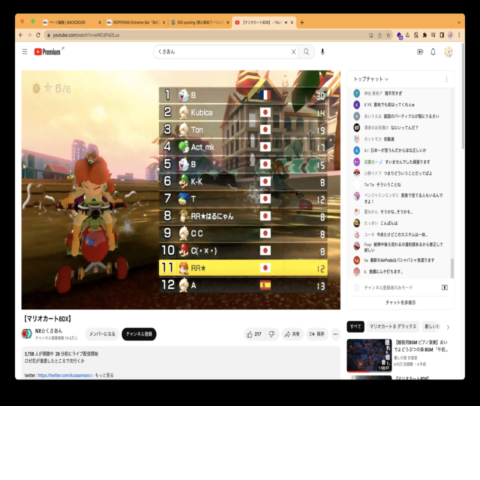

In [ ]:
def ra_generator(skip=0):
  it = base_generator(skip)
  for image, row in it:
    y = np.zeros((480, 480))
    w = row["right"] - row["left"]
    h = row["bottom"] - row["top"]
    for i in range(int(row["top"]), int(row["bottom"])):
      for j in range(int(row["left"]), int(row["right"])):
        y[i][j] = 1
    yield image, y

def ra2_generator(skip=0):
  it = base_generator(skip)
  for image, row in it:
    yield image, [row["left"], row["top"], row["right"], row["bottom"]]

ra_output_signature = (
    tf.TensorSpec(shape=(480, 480, 3), dtype=tf.float32),
    tf.TensorSpec(shape=(480, 480), dtype=tf.float32),
)

ra2_output_signature = (
    tf.TensorSpec(shape=(480, 480, 3), dtype=tf.float32),
    tf.TensorSpec(shape=(4,), dtype=tf.float32),
)

ra_train_ds = tf.data.Dataset.from_generator(ra_generator, output_signature=ra_output_signature)
ra_train_ds = ra_train_ds.batch(32).take(24).cache()
ra_valid_ds = tf.data.Dataset.from_generator(ra_generator, args=[32 * 24], output_signature=ra_output_signature)
ra_valid_ds = ra_valid_ds.batch(32).take(2).cache()
ra_tests_ds = tf.data.Dataset.from_generator(ra_generator, args=[32 * 24], output_signature=ra_output_signature)
ra_tests_ds = ra_tests_ds.batch(32).take(2)

ra2_train_ds = tf.data.Dataset.from_generator(ra2_generator, output_signature=ra2_output_signature)
ra2_train_ds = ra2_train_ds.batch(32).take(24).cache()
ra2_valid_ds = tf.data.Dataset.from_generator(ra2_generator, args=[32 * 24], output_signature=ra2_output_signature)
ra2_valid_ds = ra2_valid_ds.batch(32).take(2).cache()
ra2_tests_ds = tf.data.Dataset.from_generator(ra2_generator, args=[32 * 24], output_signature=ra2_output_signature)
ra2_tests_ds = ra2_tests_ds.batch(32).take(2)

x, y = next(iter(ra2_generator()))
print(y)
cv2_imshow(x)

In [ ]:
inputs = layers.Input((480, 480, 3))
mask = rank_screen_model(inputs)
x_ = inputs / 255
masked = x_ * tf.reshape(mask, (-1, 480, 480, 1))
x = layers.Conv2D(32, 3, activation="selu", padding="same")(masked)
x = layers.MaxPool2D(2)(x)
x = layers.Conv2D(32, 3, activation="selu", padding="same")(x)
x = layers.MaxPool2D(2)(x)
x = layers.Conv2D(32, 3, activation="selu", padding="same")(x)
x = layers.MaxPool2D(2)(x)
x = layers.Conv2D(32, 3, activation="selu", padding="same")(x)
x = layers.MaxPool2D(2)(x)
x = layers.Conv2D(32, 3, activation="selu", padding="same")(x)
x = layers.MaxPool2D(2)(x)
x = layers.Flatten()(x)
outputs = layers.Dense(4, activation="linear")(x)

ra2_model = keras.Model(inputs, outputs)
ra2_model.summary()

Model: "model_31"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_32 (InputLayer)          [(None, 480, 480, 3  0           []                               
                                )]                                                                
                                                                                                  
 model (Functional)             (None, 480, 480)     55492       ['input_32[0][0]']               
                                                                                                  
 tf.math.truediv_31 (TFOpLambda  (None, 480, 480, 3)  0          ['input_32[0][0]']               
 )                                                                                                
                                                                                           

In [ ]:
ra2_model.compile(optimizer="adam", loss=tf.keras.losses.huber)
ra2_history = ra2_model.fit(
  ra2_train_ds,
  validation_data=ra2_valid_ds, 
  callbacks=[tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=16, restore_best_weights=True)], 
  epochs=1000
)

Epoch 1/1000
24/24 [==============================] - 4s 86ms/step - loss: 108.6424 - val_loss: 38.8794
Epoch 2/1000
24/24 [==============================] - 2s 72ms/step - loss: 23.0477 - val_loss: 16.2562
Epoch 3/1000
24/24 [==============================] - 2s 72ms/step - loss: 13.8161 - val_loss: 10.5517
Epoch 4/1000
24/24 [==============================] - 2s 72ms/step - loss: 9.2908 - val_loss: 7.2682
Epoch 5/1000
24/24 [==============================] - 2s 72ms/step - loss: 7.5709 - val_loss: 6.9283
Epoch 6/1000
24/24 [==============================] - 2s 72ms/step - loss: 7.5003 - val_loss: 6.7581
Epoch 7/1000
24/24 [==============================] - 2s 72ms/step - loss: 6.1088 - val_loss: 5.1970
Epoch 8/1000
24/24 [==============================] - 2s 72ms/step - loss: 5.9263 - val_loss: 5.7804
Epoch 9/1000
24/24 [==============================] - 2s 71ms/step - loss: 5.8568 - val_loss: 6.0236
Epoch 10/1000
24/24 [==============================] - 2s 72ms/step - loss: 4.8464 -

In [ ]:
rank_screen_model.compile(optimizer="adam", loss=tf.keras.losses.huber)
ra_history = rank_screen_model.fit(
  ra_train_ds,
  validation_data=ra_valid_ds, 
  callbacks=[tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=16, restore_best_weights=True)], 
  epochs=1000
)

In [ ]:
rank_screen_model.save("rank_screen_model")

In [ ]:
!zip drive/MyDrive/mario-cart-8dx/rank_screen_model.zip -r rank_screen_model

  adding: rank_screen_model/ (stored 0%)
  adding: rank_screen_model/variables/ (stored 0%)
  adding: rank_screen_model/variables/variables.data-00000-of-00001 (deflated 9%)
  adding: rank_screen_model/variables/variables.index (deflated 71%)
  adding: rank_screen_model/fingerprint.pb (stored 0%)
  adding: rank_screen_model/assets/ (stored 0%)
  adding: rank_screen_model/saved_model.pb (deflated 91%)
  adding: rank_screen_model/keras_metadata.pb (deflated 94%)


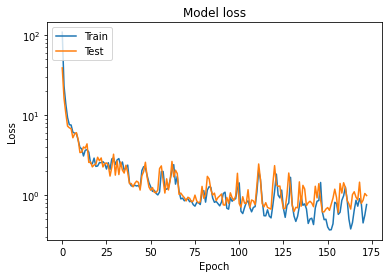

In [ ]:
import matplotlib.pyplot as plt

plt.plot(ra2_history.history['loss'])
plt.plot(ra2_history.history['val_loss'])
plt.title('Model loss')
plt.yscale('log')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
def f(x):
  x = x * 255
  a = [x, 0, 0]
  return tf.cast(a, tf.int32)

def show(x_image, y_pred):
  x = tf.constant(x_image)
  y = tf.constant(y_pred)
  image = tf.reshape(
    tf.vectorized_map(f, tf.reshape(y, (-1,))),
    (480, 480, 3)
  )
  a = x.numpy()
  b = image.numpy() // 2
  c = a + b
  cv2_imshow(c)

for x, y_true in ra_tests_ds:
  y_pred = rank_screen_model.predict(x)
  for (x, y) in zip(x, y_pred):
    show(x, y)
  break

1/1 [==============================] - 0s 293ms/step


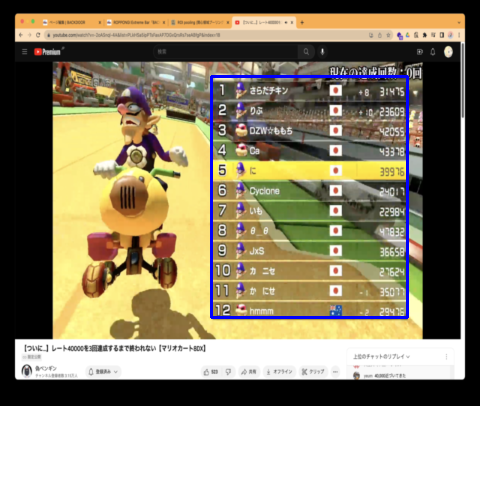

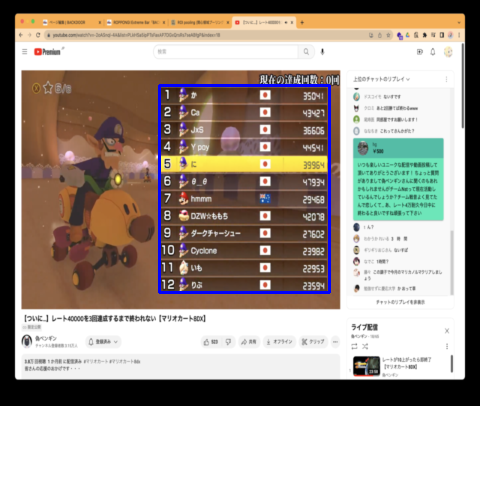

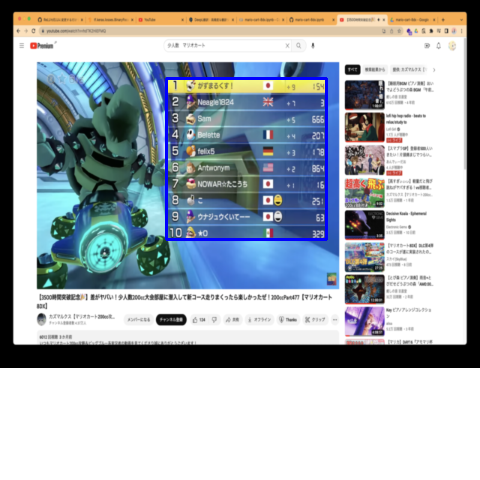

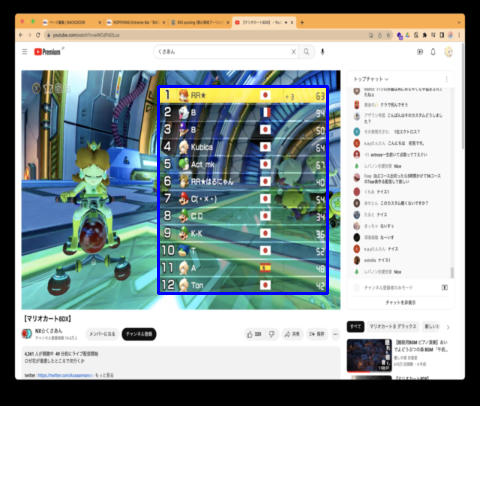

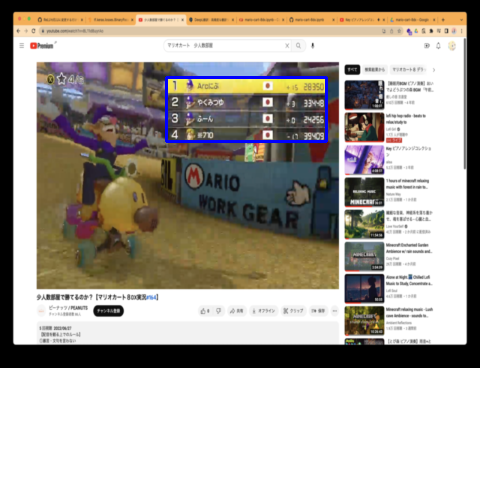

...

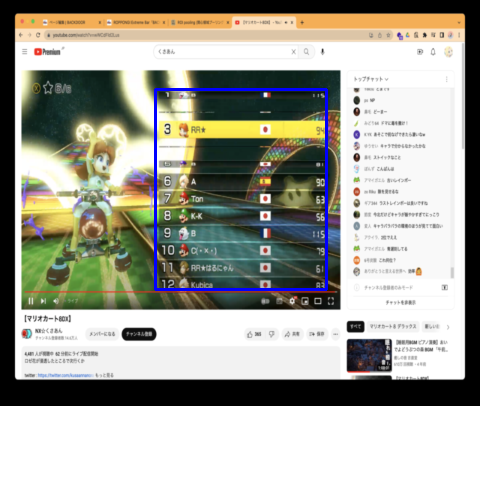

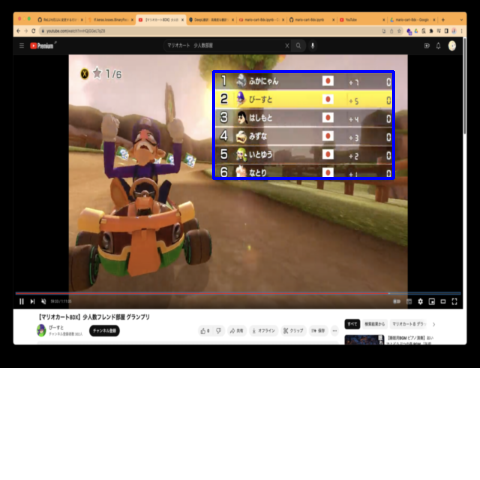

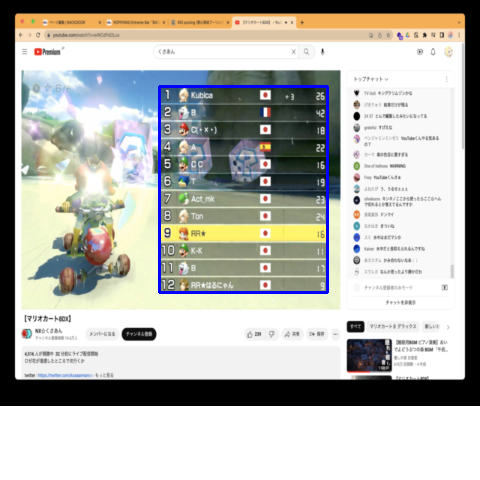

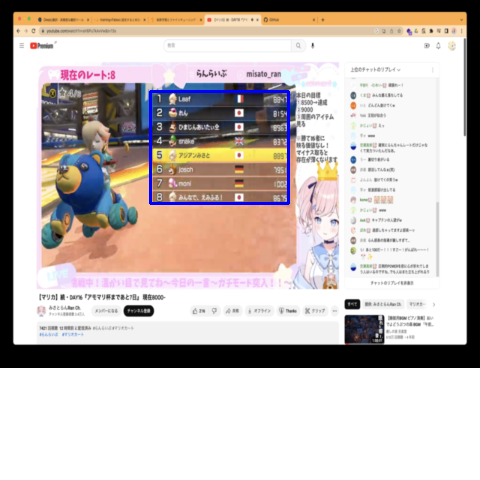

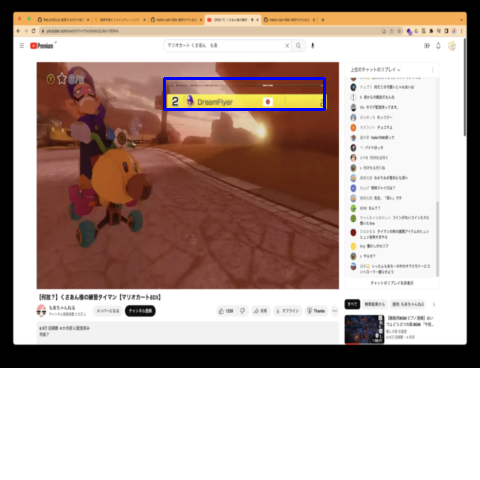

In [ ]:
def show(x_image, y_pred):
  x = tf.constant(x_image)
  y = y_pred.astype(np.int32)
  a = x.numpy()
  a = cv2.rectangle(a, [y[0], y[1]], [y[2], y[3]], color=(255, 0, 0), thickness=2)
  cv2_imshow(a)

for x, y_true in ra2_tests_ds:
  y_pred = ra2_model.predict(x)
  for (x, y) in zip(x, y_pred):
    show(x, y)
  break

In [ ]:
inputs = layers.Input((480, 480, 3))
x = rank_screen_model(inputs)
x = tf.reshape(x, (-1, 480, 480, 1))
x = layers.Conv2D(8, 3, activation="selu", padding="same")(x)
x = layers.MaxPool2D(2)(x)
x = layers.Conv2D(8, 3, activation="selu", padding="same")(x)
x = layers.MaxPool2D(2)(x)
x = layers.Conv2D(8, 3, activation="selu", padding="same")(x)
x = layers.MaxPool2D(2)(x)
x = layers.Conv2D(8, 3, activation="selu", padding="same")(x)
x = layers.MaxPool2D(2)(x)
x = layers.Conv2D(8, 3, activation="selu", padding="same")(x)
x = layers.MaxPool2D(2)(x)
x = layers.Flatten()(x)
outputs = layers.Dense(4, activation="linear")(x)
co_model = keras.Model(inputs, outputs)
co_model.summary()

Model: "model_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_19 (InputLayer)       [(None, 480, 480, 3)]     0         
                                                                 
 model (Functional)          (None, 480, 480)          55492     
                                                                 
 tf.reshape_18 (TFOpLambda)  (None, 480, 480, 1)       0         
                                                                 
 conv2d_88 (Conv2D)          (None, 480, 480, 8)       80        
                                                                 
 max_pooling2d_59 (MaxPoolin  (None, 240, 240, 8)      0         
 g2D)                                                            
                                                                 
 conv2d_89 (Conv2D)          (None, 240, 240, 8)       584       
                                                          

In [ ]:
def co_generator(skip=0):
  it = base_generator(skip)
  for image, row in it:
    yield image, [row["left"], row["top"], row["right"], row["bottom"]]

co_output_signature = (
  tf.TensorSpec(shape=(480, 480, 3), dtype=tf.float32),
  tf.TensorSpec(shape=(4,), dtype=tf.float32),
)

co_train_ds = tf.data.Dataset.from_generator(co_generator, output_signature=co_output_signature)
co_train_ds = co_train_ds.batch(32).take(12).cache()
co_valid_ds = tf.data.Dataset.from_generator(co_generator, args=[32 * 12], output_signature=co_output_signature)
co_valid_ds = co_valid_ds.batch(32).take(4).cache()
co_tests_ds = tf.data.Dataset.from_generator(co_generator, args=[32 * 12 + 32 * 4], output_signature=co_output_signature)
co_tests_ds = co_tests_ds.repeat().batch(32).take(2)

In [ ]:
co_model.compile(optimizer="adam", loss=tf.keras.losses.huber)
co_history = co_model.fit(
  co_train_ds,
  validation_data=co_valid_ds,
  callbacks=[callbacks.EarlyStopping(monitor="val_loss", patience=16, restore_best_weights=True)],
  epochs=1000
)

Epoch 1/1000
12/12 [==============================] - 8s 477ms/step - loss: 198.0986 - val_loss: 189.9840
Epoch 2/1000
12/12 [==============================] - 1s 71ms/step - loss: 164.9314 - val_loss: 111.0807
Epoch 3/1000
12/12 [==============================] - 1s 70ms/step - loss: 72.2071 - val_loss: 34.2373
Epoch 4/1000
12/12 [==============================] - 1s 70ms/step - loss: 30.4931 - val_loss: 30.8014
Epoch 5/1000
12/12 [==============================] - 1s 70ms/step - loss: 24.4692 - val_loss: 23.1459
Epoch 6/1000
12/12 [==============================] - 1s 69ms/step - loss: 22.1871 - val_loss: 20.6088
Epoch 7/1000
12/12 [==============================] - 1s 70ms/step - loss: 19.9872 - val_loss: 18.7350
Epoch 8/1000
12/12 [==============================] - 1s 69ms/step - loss: 17.6502 - val_loss: 16.4524
Epoch 9/1000
12/12 [==============================] - 1s 70ms/step - loss: 15.2646 - val_loss: 13.7328
Epoch 10/1000
12/12 [==============================] - 1s 70ms/step 

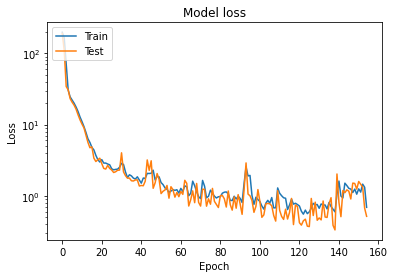

In [ ]:
import matplotlib.pyplot as plt

plt.plot(co_history.history['loss'])
plt.plot(co_history.history['val_loss'])
plt.title('Model loss')
plt.yscale('log')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

1/1 [==============================] - 0s 337ms/step


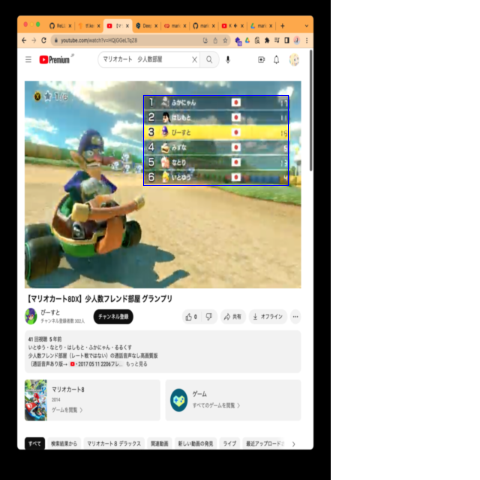

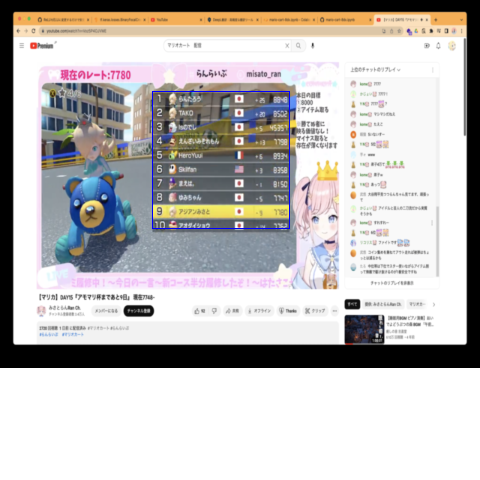

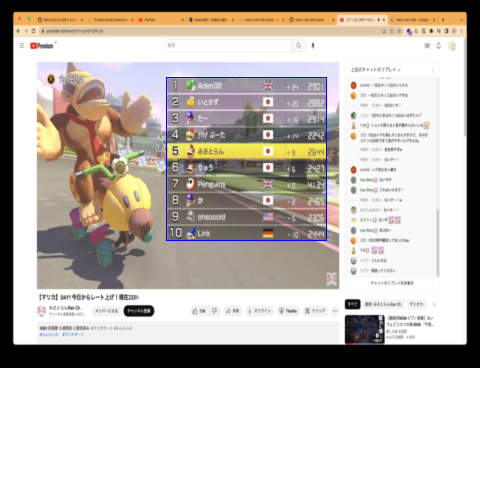

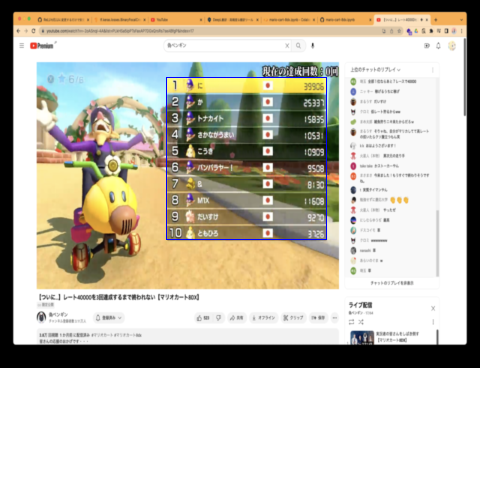

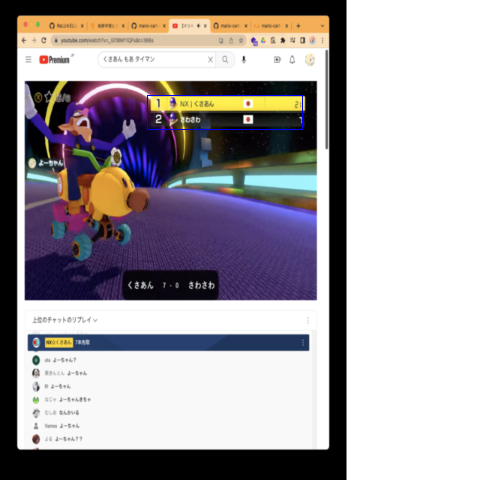

...

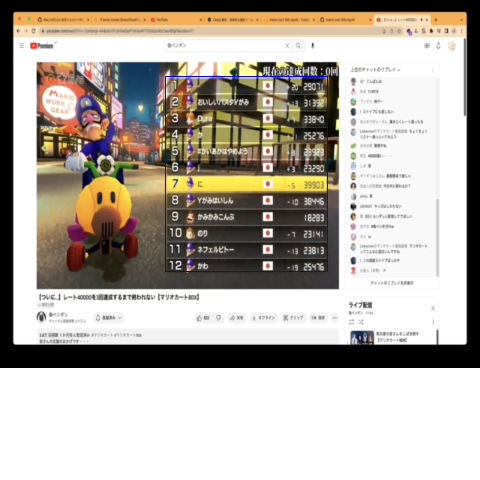

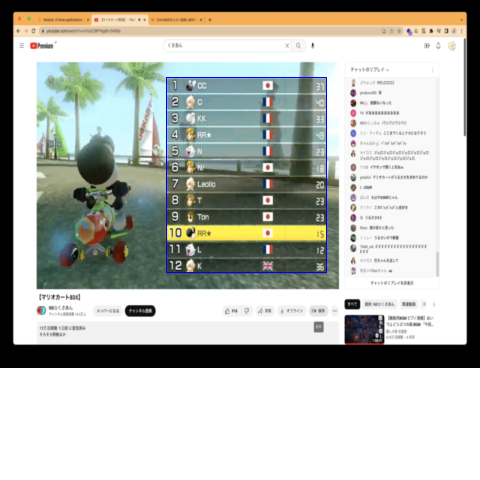

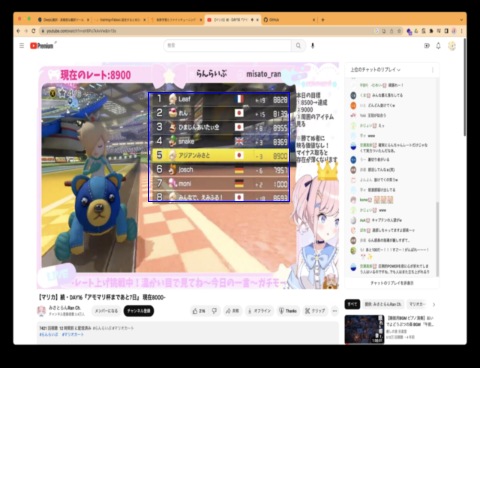

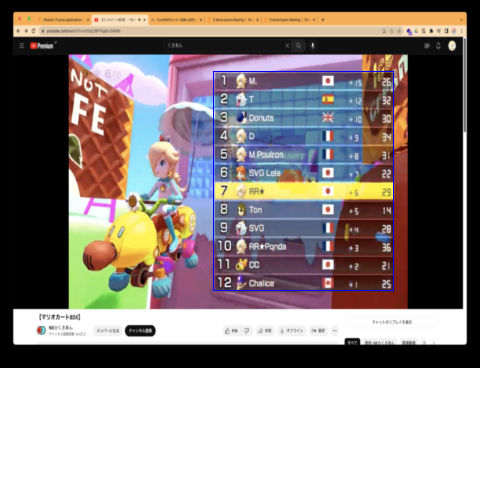

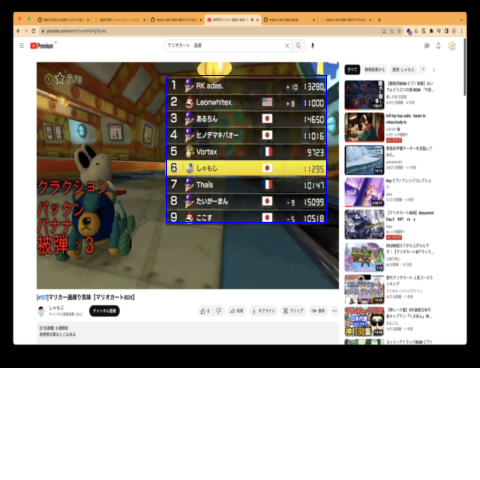

In [ ]:
def show(x_image, y_pred):
  x = tf.constant(x_image)
  y = tf.constant(y_pred)
  image = x_image.numpy()
  image = cv2.rectangle(image, [int(y_pred[0]), int(y_pred[1])], [int(y_pred[2]), int(y_pred[3])], color=(255, 0, 0))
  cv2_imshow(image)

for x, y_true in co_tests_ds:
  y_pred = co_model.predict(x)
  for (x, y) in zip(x, y_pred):
    show(x, y)
  break

In [ ]:
co_model.save("co_model")

In [ ]:
!zip drive/MyDrive/mario-cart-8dx/co_model.zip -r co_model

updating: co_model/ (stored 0%)
updating: co_model/variables/ (stored 0%)
updating: co_model/variables/variables.data-00000-of-00001 (deflated 15%)
updating: co_model/variables/variables.index (deflated 70%)
updating: co_model/fingerprint.pb (stored 0%)
updating: co_model/assets/ (stored 0%)
updating: co_model/saved_model.pb (deflated 90%)
updating: co_model/keras_metadata.pb (deflated 95%)


In [ ]:
def show(x_image, y_pred):
  x = tf.constant(x_image)
  y = tf.constant(y_pred)
  image = x_image.numpy()
  image = cv2.rectangle(image, [int(y_pred[0]), int(y_pred[1])], [int(y_pred[2]), int(y_pred[3])], color=(255, 0, 0))
  cv2_imshow(image)

for x, y_true in co_tests_ds:
  y_pred = co_model.predict(x)
  for (x, y) in zip(x, y_pred):
    show(x, y)
  break

In [ ]:
def pa_generator(skip=0):
  with open('./rank-screen/index.json', 'r') as f:
    j = json.load(f)
  random.seed(0)
  random.shuffle(j)
  for i, row in enumerate(j):
    if i < skip:
      continue
    path = pathlib.Path("rank-screen")/row["path"]
    path = str(path)
    image = cv2.imread(path)
    image = cv2.resize(image, (480, 480))
    yield image, row["participants"]

pa_output_signature = (
    tf.TensorSpec(shape=(480, 480, 3), dtype=tf.float32),
    tf.TensorSpec(shape=(), dtype=tf.float32),
)

pa_train_ds = tf.data.Dataset.from_generator(pa_generator, output_signature=pa_output_signature)
pa_train_ds = pa_train_ds.repeat().batch(32).take(18)
pa_valid_ds = tf.data.Dataset.from_generator(pa_generator, args=[32 * 16], output_signature=pa_output_signature)
pa_valid_ds = pa_valid_ds.repeat().batch(32).take(1)
pa_tests_ds = tf.data.Dataset.from_generator(pa_generator, args=[32 * 16 + 32], output_signature=pa_output_signature)
pa_tests_ds = pa_tests_ds.repeat().batch(32).take(1)

In [ ]:
!unzip -q drive/MyDrive/mario-cart-8dx/participants_model.zip

In [ ]:
pa_model = models.load_model("participants_model")
pa_model.summary()

Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_14 (InputLayer)          [(None, 480, 480, 3  0           []                               
                                )]                                                                
                                                                                                  
 model (Functional)             (None, 480, 480)     55492       ['input_14[0][0]']               
                                                                                                  
 tf.reshape_12 (TFOpLambda)     (None, 480, 480, 1)  0           ['model[0][0]']                  
                                                                                                  
 tf.math.multiply_13 (TFOpLambd  (None, 480, 480, 3)  0          ['input_14[0][0]',        

In [ ]:
inputs = tf.keras.layers.Input((480, 480, 3))
mask = rank_screen_model(inputs)
mask = tf.reshape(mask, (-1, 480, 480, 1))
masked = inputs * mask
x = tf.keras.layers.Conv2D(32, 3, padding="same", activation="selu")(masked)
x = tf.keras.layers.MaxPool2D(2)(x)
x = tf.keras.layers.Conv2D(32, 3, padding="same", activation="selu")(x)
x = tf.keras.layers.MaxPool2D(2)(x)
x = tf.keras.layers.Conv2D(32, 3, padding="same", activation="selu")(x)
x = tf.keras.layers.MaxPool2D(2)(x)
x = tf.keras.layers.Conv2D(32, 3, padding="same", activation="selu")(x)
x = tf.keras.layers.MaxPool2D(2)(x)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
outputs = tf.keras.layers.Dense(1, activation="linear")(x)
pa_model = tf.keras.Model(inputs, outputs)
pa_model.summary()

Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_14 (InputLayer)          [(None, 480, 480, 3  0           []                               
                                )]                                                                
                                                                                                  
 model (Functional)             (None, 480, 480)     55492       ['input_14[0][0]']               
                                                                                                  
 tf.reshape_12 (TFOpLambda)     (None, 480, 480, 1)  0           ['model[13][0]']                 
                                                                                                  
 tf.math.multiply_13 (TFOpLambd  (None, 480, 480, 3)  0          ['input_14[0][0]',        

In [ ]:
pa_model.compile(loss=tf.keras.losses.huber, optimizer="adam")
pa_history = pa_model.fit(
  pa_train_ds,
  validation_data=pa_valid_ds,
  callbacks=[tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=16, restore_best_weights=True)],
  epochs=1000
)

Epoch 174/1000
18/18 [==============================] - 13s 532ms/step - loss: 0.4289 - val_loss: 0.0990
Epoch 175/1000
18/18 [==============================] - 9s 462ms/step - loss: 0.0857 - val_loss: 0.0847
Epoch 176/1000
18/18 [==============================] - 9s 472ms/step - loss: 0.1228 - val_loss: 0.0974
Epoch 177/1000
18/18 [==============================] - 10s 538ms/step - loss: 0.0661 - val_loss: 0.0673
Epoch 178/1000
18/18 [==============================] - 10s 523ms/step - loss: 0.0808 - val_loss: 0.0671
Epoch 179/1000
18/18 [==============================] - 9s 477ms/step - loss: 0.0867 - val_loss: 0.0619
Epoch 180/1000
18/18 [==============================] - 10s 531ms/step - loss: 0.0654 - val_loss: 0.0580
Epoch 181/1000
18/18 [==============================] - 10s 540ms/step - loss: 0.0574 - val_loss: 0.0566
Epoch 182/1000
18/18 [==============================] - 9s 480ms/step - loss: 0.0622 - val_loss: 0.0583
Epoch 183/1000
18/18 [==============================] - 9s 

In [ ]:
pa_model.save("participants_model")

In [ ]:
!zip drive/MyDrive/mario-cart-8dx/participants_model.zip -r participants_model

  adding: participants_model/ (stored 0%)
  adding: participants_model/variables/ (stored 0%)
  adding: participants_model/variables/variables.data-00000-of-00001 (deflated 11%)
  adding: participants_model/variables/variables.index (deflated 70%)
  adding: participants_model/fingerprint.pb (stored 0%)
  adding: participants_model/assets/ (stored 0%)
  adding: participants_model/saved_model.pb (deflated 90%)
  adding: participants_model/keras_metadata.pb (deflated 95%)


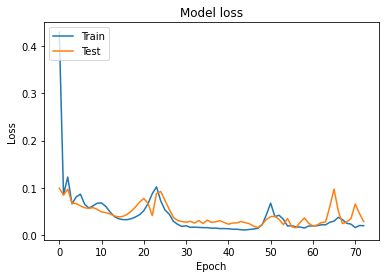

In [ ]:
import matplotlib.pyplot as plt

plt.plot(pa_history.history['loss'])
plt.plot(pa_history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

1/1 [==============================] - 11s 11s/step


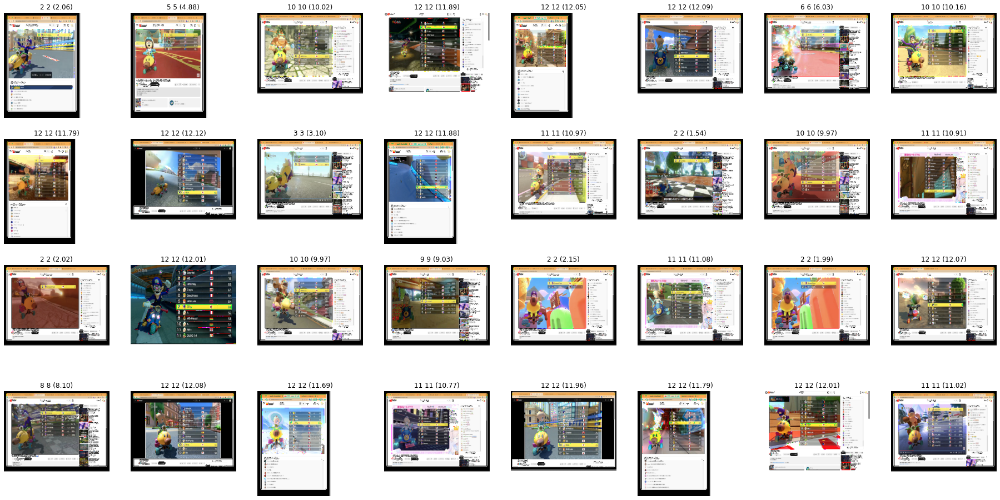

In [ ]:
fig = plt.figure(figsize=(32, 16))
rows = 4
columns = 8
index = 0

for x, y_true in pa_tests_ds:
  y_pred = pa_model.predict(x)
  for (x, y_true, y) in zip(x, y_true, y_pred):
    image = x.numpy()
    image = cv2.resize(image, (240, 240), interpolation=cv2.INTER_CUBIC)
    image = np.flip(image, axis=-1)
    image = image.astype(np.uint8)

    index += 1

    fig.add_subplot(rows, columns, index)
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"{y_true:.0f} {y[0]:.0f} ({y[0]:.2f})")